# SVI patterns (slide-seq mouse brain dataset)
This notebook showcases the SVI patterns using the slide-seq mouse brain dataset

In [10]:
import sys
import os
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
import matplotlib.pyplot as plt
import time
R_path = 'source /etc/profile;module load GCC/11.2.0 OpenMPI/4.1.1 R/4.2.0 Anaconda3/2022.05 R-bundle-Bioconductor/3.15-R-4.2.0;R'
from spider import SPIDER
op=SPIDER()
%reload_ext autoreload
%autoreload 2
from utils import *

ds = 'slide-seq-v2'
sample_name = 'mousebrain'
adata = anndata.read_h5ad(f'../example_datasets/{ds}/{sample_name}/adata.h5ad')

if not os.path.exists(f'../results/{ds}'):
    os.makedirs(f'../results/{ds}/')
out_f = f'../results/{ds}/{sample_name}/'
if not os.path.exists(out_f):
    os.makedirs(out_f)
if len(adata.obs_names) > 200:
    sc.pp.filter_genes(adata, min_cells=20)
    
idata = anndata.read_h5ad(f'../results/{ds}/{sample_name}/idata.h5ad')
    
# start = time.time()
# idata = op.prep(adata, cluster_key=adata.uns['cluster_key'], is_human=adata.uns['is_human'], is_sc=adata.uns['is_sc'], itermax=1000, imputation=True, normalize_total=True)
# idata.write(f'{out_f}idata.h5ad')
# runtime = time.time()-start
# with open(f'{out_f}ot_runtime.txt', 'w') as f:
#     f.write(str(runtime))
    
start = time.time()
op.svi.tf_corr(idata, adata, adata.uns['is_human'], out_f, threshold=0.3, n_jobs=30, overwrite=False, step=None, keep_top_score=5)
runtime = time.time()-start
with open(f'{out_f}tf_runtime.txt', 'w') as f:
    f.write(str(runtime))
    
start = time.time()
idata, meta_idata = op.find_svi(idata, out_f, R_path, alpha=0.3, overwrite=False, n_jobs=1, svi_number=0)
runtime = time.time()-start
with open(f'{out_f}svi_runtime.txt', 'w') as f:
    f.write(str(runtime))

Using mouse pathway dataset.
                 src   dest
Man1a_Mgat1    Man1a  Mgat1
Man1b1_Man1a  Man1b1  Man1a
Nrg2_Egfr       Nrg2   Egfr
Nrg2_Erbb2      Nrg2  Erbb2
Nrg2_Erbb3      Nrg2  Erbb3
Found 1037 SV pathway nodes.
Found 59/69 receptors (86%) with SV target genes.
Testing 114/163 LRIs (70%) with SV target genes.
106/114 LRIs (93%) are predicted to be activated by downstream genes (threshold=0.3).
Excluded 8/163 LRIs (5%) without SV support (threshold=0.3).
using 149*149 SOM nodes for 111461 points
Added key nnSVG in idata.uns
Added key SOMDE in idata.uns
Added key SpatialDE2 in idata.uns
Added key SpatialDE in idata.uns
Added key SPARKX in idata.uns
Added key scGCO in idata.uns
Added key moranI in idata.uns
Added key gearyC in idata.uns
finished running all SVI tests
Using the results from SVI identification methods: ['SOMDE' 'SpatialDE' 'SpatialDE2' 'SPARKX' 'nnSVG' 'scGCO' 'gearyC'
 'moranI']
126/163 SVIs identified (threshold=0.01).
Excluding 7 genes without TF support
11

Using the results from SVI identification methods: ['SOMDE' 'SpatialDE' 'SpatialDE2' 'SPARKX' 'nnSVG' 'scGCO' 'gearyC'
 'moranI']
126/163 SVIs identified (threshold=0.01).
Excluding 7 genes without TF support
119/163 tf-supported SVIs identified.
evaluating with ['moranI' 'gearyC' 'SOMDE' 'nnSVG']
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Geary
C (rev.)_SVI vs. Geary
C (rev.)_Excluded: Mann-Whitney-Wilcoxon test greater with Benjamini-Hochberg correction, P_val:1.897e-06 U_stat=3.855e+03
Moran
I_SVI vs. Moran
I_Excluded: Mann-Whitney-Wilcoxon test greater with Benjamini-Hochberg correction, P_val:1.612e-06 U_stat=3.864e+03
FSV
(SOMDE)_SVI vs. FSV
(SOMDE)_Excluded: Mann-Whitney-Wilcoxon test greater with Benjamini-Hochberg correction, P_val:1.562e-07 U_stat=3.987e+03
LR
(SOMDE)_SVI vs. LR
(SOMDE)_Excluded: Mann-Whitney-Wilcoxon test greater with Benj

,Category,Metric,value
0,Excluded,Moran\nI,1.000000
1,SVI,Moran\nI,0.990115
2,SVI,Moran\nI,0.964646
3,SVI,Moran\nI,0.956778
4,SVI,Moran\nI,0.943627
...,...,...,...
972,Excluded,TF corr,0.531543
973,Excluded,TF corr,0.537164
974,Excluded,TF corr,0.376015
975,Excluded,TF corr,0.480949


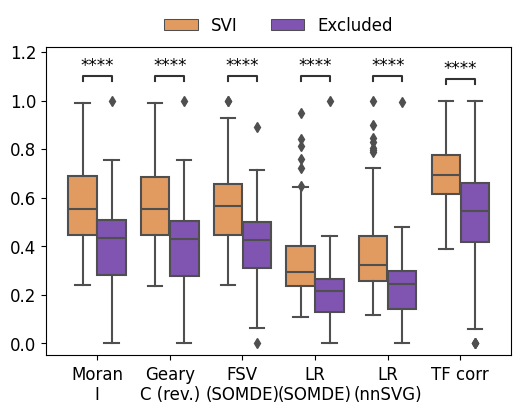

In [11]:
svi_df, svi_df_strict = op.svi.combine_SVI(idata,threshold=0.01)
op.svi.eva_SVI(idata, svi_df_strict)

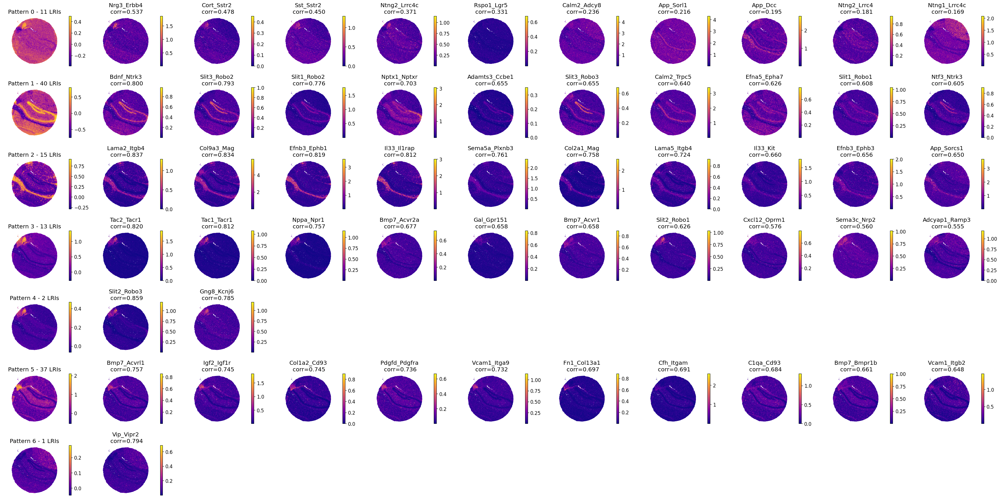

In [12]:
import matplotlib.pyplot as plt
op.vis.pattern_LRI(idata,show_SVI=10, spot_size=1)
plt.tight_layout()

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1_non-member vs. 1_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:3.707e-19 U_stat=3.000e+00
0_non-member vs. 0_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:1.684e-06 U_stat=8.700e+01
2_non-member vs. 2_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:2.174e-10 U_stat=0.000e+00
3_non-member vs. 3_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:7.921e-09 U_stat=2.500e+01
4_non-member vs. 4_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:8.546e-04 U_stat=3.000e+00
5_non-member vs. 5_member: Mann-Whitney-Wilcoxon test smaller with Benjamini-Hochberg correction, P_val:7.028e-17 U_stat=7.700e+01
6_non-member vs. 6_member: Mann-W

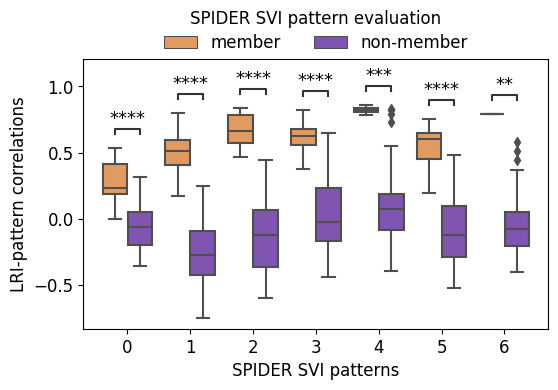

In [13]:
plt.figure(figsize=(6,3.5))
op.svi.eva_pattern(idata)


Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns
['Lama2_Itgb4' 'Col9a3_Mag' 'Efnb3_Ephb1' 'Il33_Il1rap']
['Bdnf_Ntrk3' 'Slit3_Robo2' 'Slit1_Robo2' 'Nptx1_Nptxr']
['Bdnf_Ntrk3' 'Slit3_Robo2' 'Slit1_Robo2' 'Nptx1_Nptxr']
['Bmp7_Acvrl1' 'Igf2_Igf1r' 'Col1a2_Cd93' 'Pdgfd_Pdgfra']
['Bmp7_Acvrl1' 'Igf2_Igf1r' 'Col1a2_Cd93' 'Pdgfd_Pdgfra']
['Tac2_Tacr1' 'Tac1_Tacr1' 'Nppa_Npr1' 'Bmp7_Acvr2a']


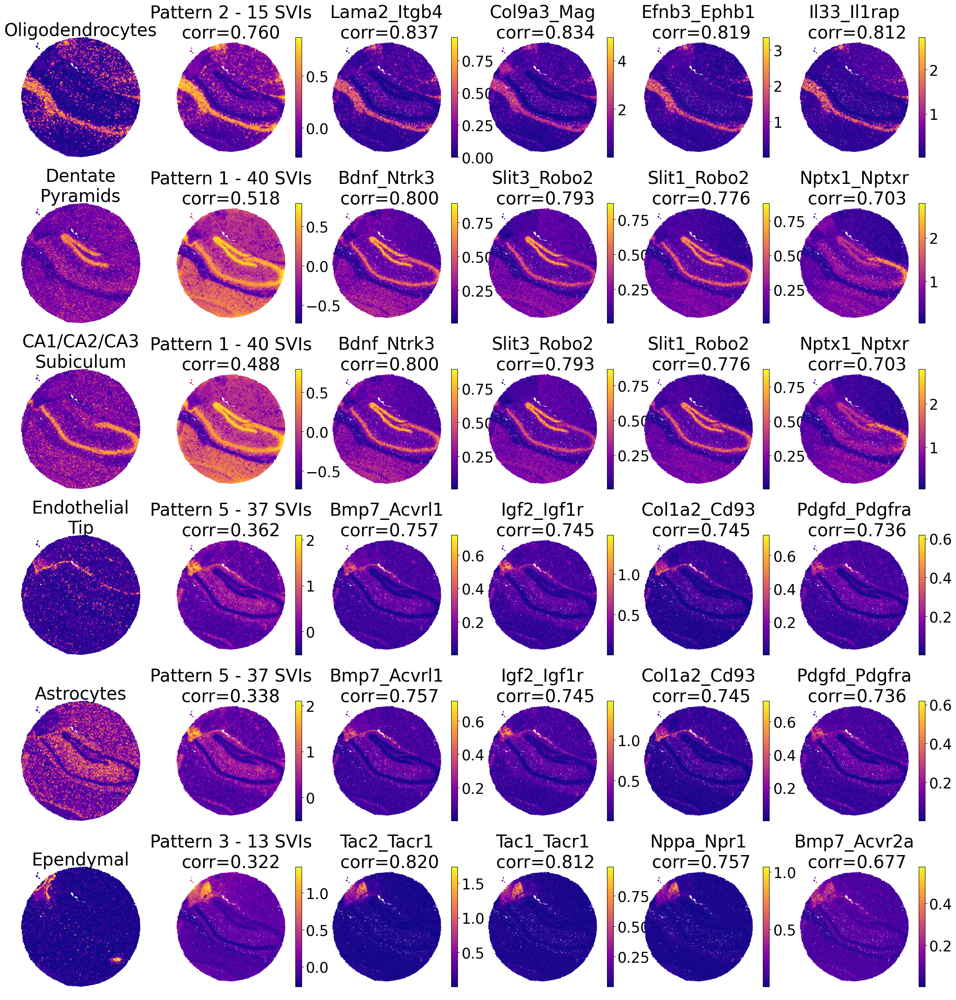

In [14]:
mouse_brain_pattern_corr(idata, adata)

In [15]:
idata = idata[:, idata.var['is_svi']==1]
adata, adata_lri, adata_pattern = op.cell_transform(idata, adata, label=adata.uns['cluster_key'])
adata_lri.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']
adata_pattern.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']

Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns


In [17]:
sc.pp.neighbors(adata_pattern, n_neighbors=10, use_rep='X')
sc.tl.paga(adata_pattern)
sc.pl.paga(adata_pattern, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_pattern, init_pos='paga')
sc.tl.umap(adata_pattern)
sc.tl.leiden(adata_pattern,resolution=0.5, seed=0)
# sc.pl.umap(adata_pattern, color=['leiden'])
main_clusters = adata_pattern.obs['leiden'].value_counts().index[adata_pattern.obs['leiden'].value_counts() > 100].to_numpy()
adata_pattern_subset = adata_pattern[adata_pattern.obs['leiden'].isin(main_clusters)]

(646.62, 5923.9800000000005, 520.828, 5830.1320000000005)

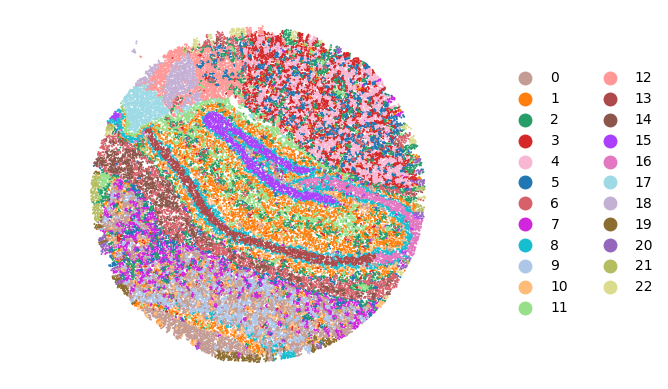

In [19]:
pallete = {'0': '#c49c94',
 '1': '#ff7f0e',
 '2': '#279e68',
 '3': '#d62728',
 '4': '#f7b6d2',
 '5': '#1f77b4',
 '6': '#d6616b',
 '7': '#d027dd',
 '8': '#17becf',
 '9': '#aec7e8',
 '10': '#ffbb78',
 '11': '#98df8a',
 '12': '#ff9896',
 '18': '#c5b0d5',
 '14': '#8c564b',
 '15': '#aa40fc',
 '16': '#e377c2',
 '17': '#9edae5',
 '13': '#ad494a',
 '19': '#8c6d31',
 '20': '#9467bd',
 '21': '#b5bd61',
 '22': '#dbdb8d',
}

to_plot = pd.DataFrame(adata_pattern_subset.obs['leiden'])
to_plot[['x','y']] = adata_pattern_subset.obsm['spatial']
import seaborn as sns
# custom_palette = sns.color_palette("husl",to_plot.leiden.nunique())
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden', palette=pallete, s=2, linewidth=0, legend=True)
# move legend to right
plt.legend(bbox_to_anchor=(1, 0.85), loc=2, borderaxespad=0., ncols=2, frameon=False, fontsize=10, markerscale=1.5)
plt.axis('equal')
plt.axis('off')

In [21]:
%reload_ext autoreload
%autoreload 2
from utils import *

<Figure size 2000x1500 with 0 Axes>

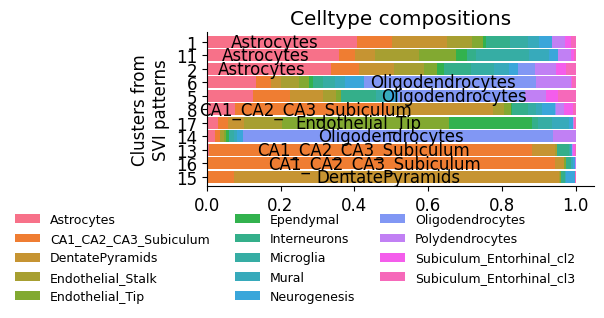

In [29]:
mouse_brain_ct_comp(adata_pattern_subset)

(646.62, 5923.9800000000005, 520.828, 5830.1320000000005)

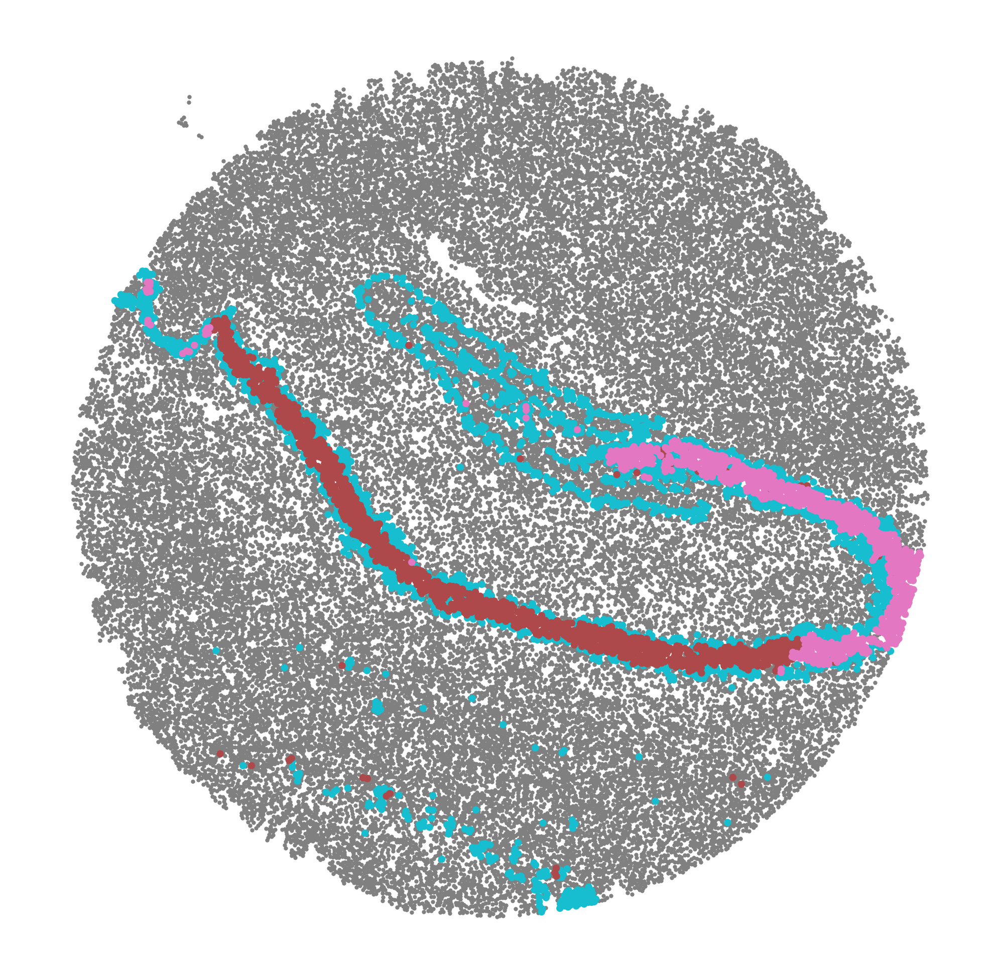

In [34]:
to_plot['leiden_ca'] = to_plot['leiden']
to_plot.loc[to_plot[~to_plot['leiden'].isin(['8', '13', '16'])].index, 'leiden_ca'] = np.nan
to_plot = to_plot.sort_values('leiden_ca', ascending=True)
sns.scatterplot(data=to_plot, x='x', y='y', s=1, linewidth=0, legend=False, color='grey')
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden_ca', s=3, linewidth=0, legend=False, palette=pallete)
# move legend to right
plt.legend(bbox_to_anchor=(0.75, 1), loc=2, borderaxespad=0., ncols=1, frameon=False)
plt.axis('equal')
plt.axis('off')

{'mainplot_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

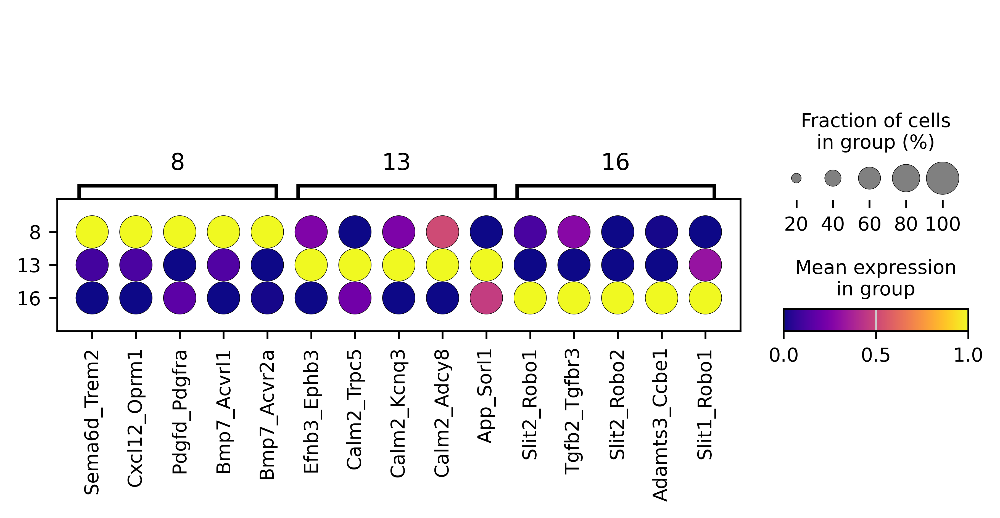

In [35]:
adata_lri.obs['leiden'] = adata_pattern.obs['leiden']
adata_lri_sub = adata_lri[adata_lri.obs['leiden'].isin(['8', '13', '16'])]
sc.tl.rank_genes_groups(adata_lri_sub, groupby='leiden')
sc.set_figure_params(dpi=300, fontsize=10)
sc.pl.rank_genes_groups_dotplot(adata_lri_sub, standard_scale='var', n_genes=5, show=False, dendrogram=False, color_map='plasma')

(646.62, 5923.9800000000005, 520.828, 5830.1320000000005)

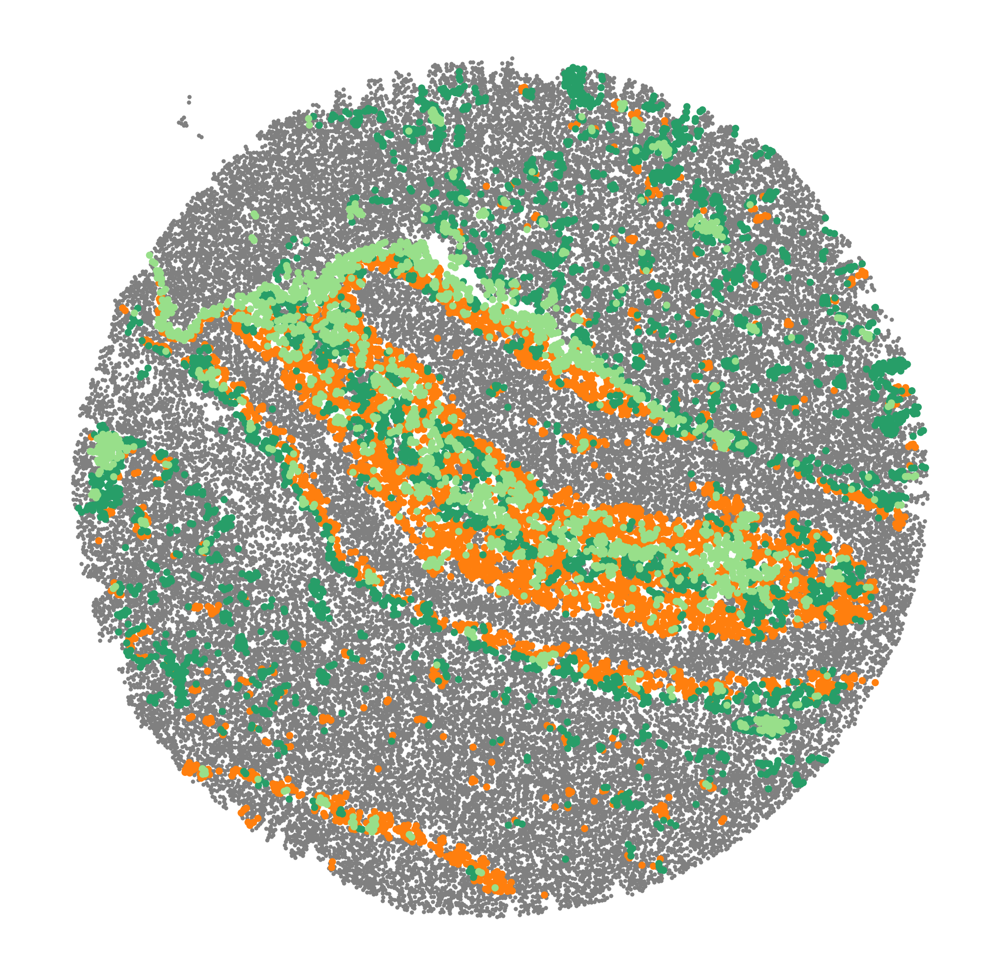

In [36]:
to_plot['leiden_ca'] = to_plot['leiden']
to_plot.loc[to_plot[~to_plot['leiden'].isin(['2', '11', '1'])].index, 'leiden_ca'] = np.nan
to_plot = to_plot.sort_values('leiden_ca', ascending=True)
sns.scatterplot(data=to_plot, x='x', y='y', s=1, linewidth=0, legend=False, color='grey')
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden_ca', s=3, linewidth=0, legend=False, palette=pallete)
# move legend to right
plt.legend(bbox_to_anchor=(0.75, 1), loc=2, borderaxespad=0., ncols=1, frameon=False)
plt.axis('equal')
plt.axis('off')

{'mainplot_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

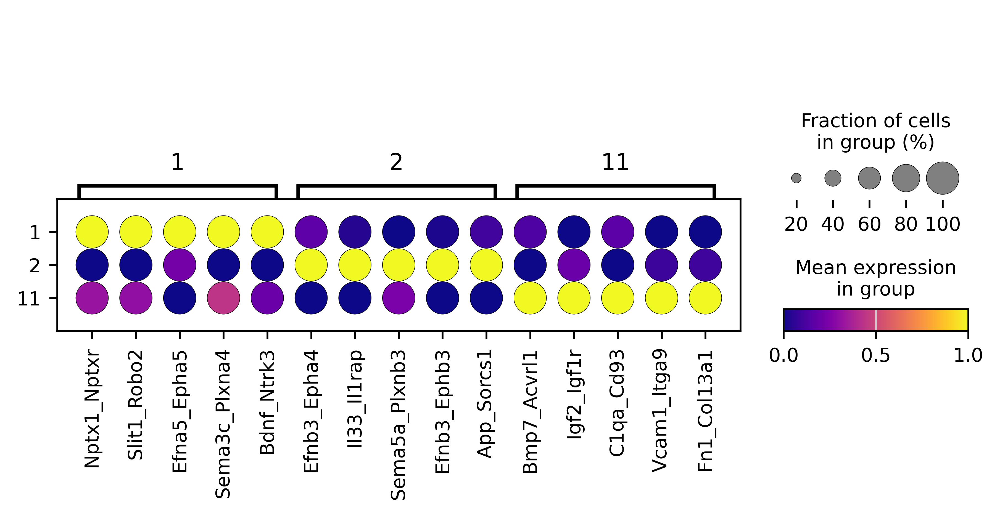

In [37]:
adata_lri.obs['leiden'] = adata_pattern.obs['leiden']
adata_lri_sub = adata_lri[adata_lri.obs['leiden'].isin(['2', '11', '1'])]
sc.tl.rank_genes_groups(adata_lri_sub, groupby='leiden')
sc.set_figure_params(dpi=300, fontsize=10)
sc.pl.rank_genes_groups_dotplot(adata_lri_sub, standard_scale='var', n_genes=5, show=False, dendrogram=False, color_map='plasma')

(646.62, 5923.9800000000005, 520.828, 5830.1320000000005)

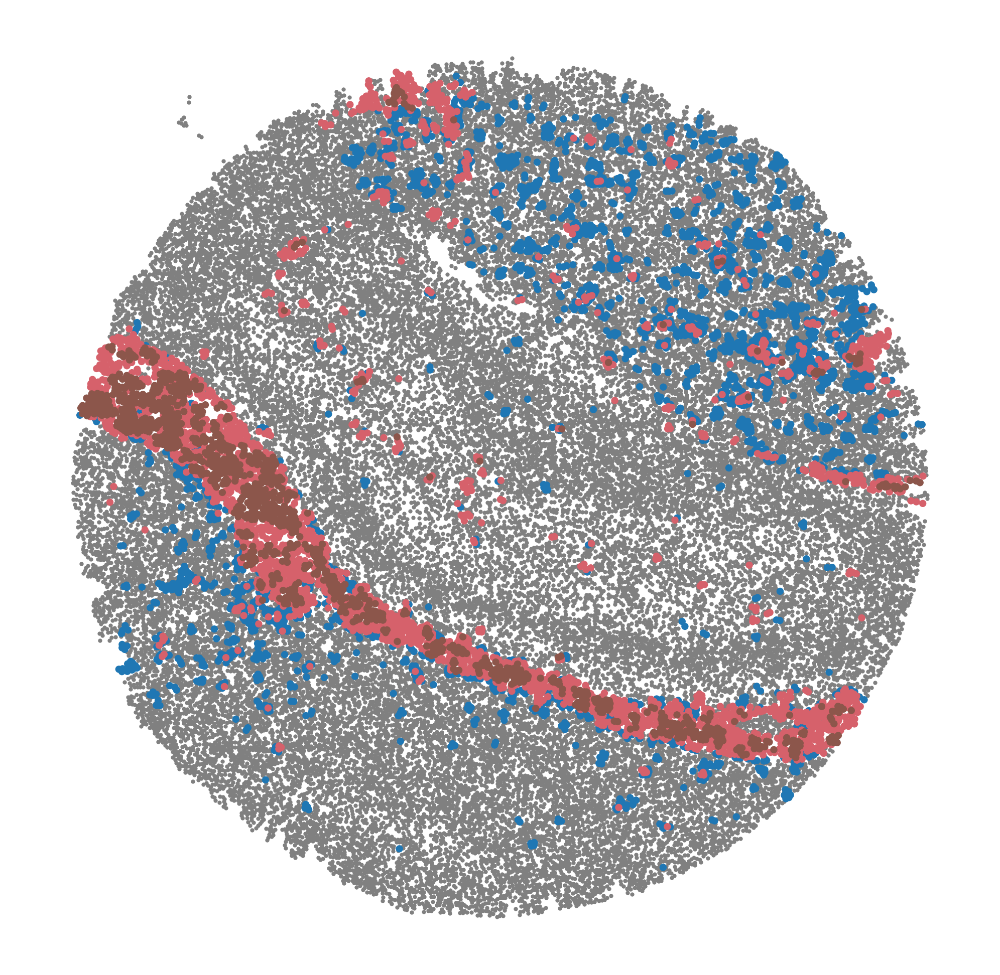

In [38]:
to_plot['leiden_ca'] = to_plot['leiden']
to_plot.loc[to_plot[~to_plot['leiden'].isin(['5', '6', '14'])].index, 'leiden_ca'] = np.nan
to_plot = to_plot.sort_values('leiden_ca', ascending=True)
sns.scatterplot(data=to_plot, x='x', y='y', s=1, linewidth=0, legend=False, color='grey')
sns.scatterplot(data=to_plot, x='x', y='y', hue='leiden_ca', s=3, linewidth=0, legend=False, palette=pallete)
# move legend to right
plt.legend(bbox_to_anchor=(0.75, 1), loc=2, borderaxespad=0., ncols=1, frameon=False)
plt.axis('equal')
plt.axis('off')

{'mainplot_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

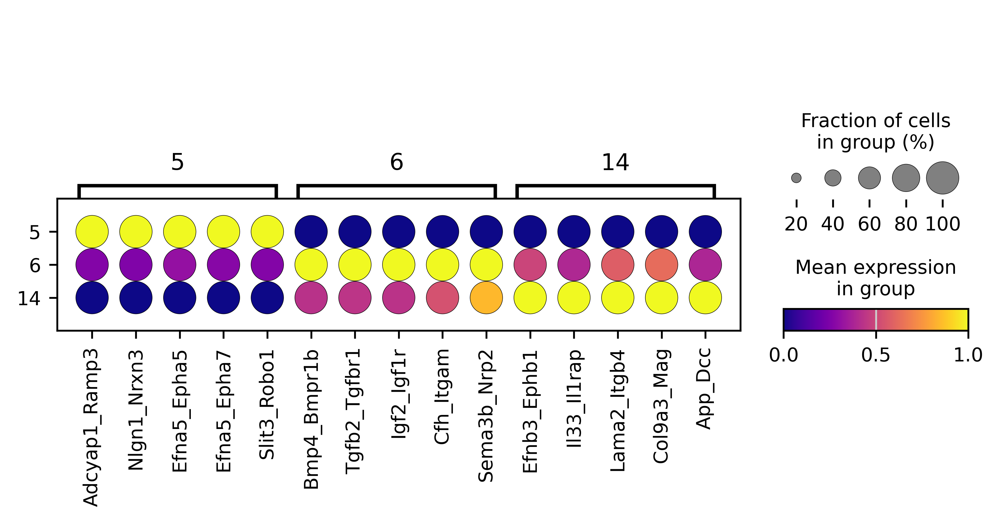

In [39]:
adata_lri.obs['leiden'] = adata_pattern.obs['leiden']
adata_lri_sub = adata_lri[adata_lri.obs['leiden'].isin(['5', '6', '14'])]
sc.tl.rank_genes_groups(adata_lri_sub, groupby='leiden')
sc.set_figure_params(dpi=300, fontsize=10)
sc.pl.rank_genes_groups_dotplot(adata_lri_sub, standard_scale='var', n_genes=5, show=False, dendrogram=False, color_map='plasma')

supp

In [40]:
merged_df_edge, arr = op.er.pattern_enrichment_edge(idata,is_human=adata.uns['is_human'])
merged_df_node, arr = op.er.pattern_enrichment_node(idata,is_human=adata.uns['is_human'])


Using mouse LR pair dataset.


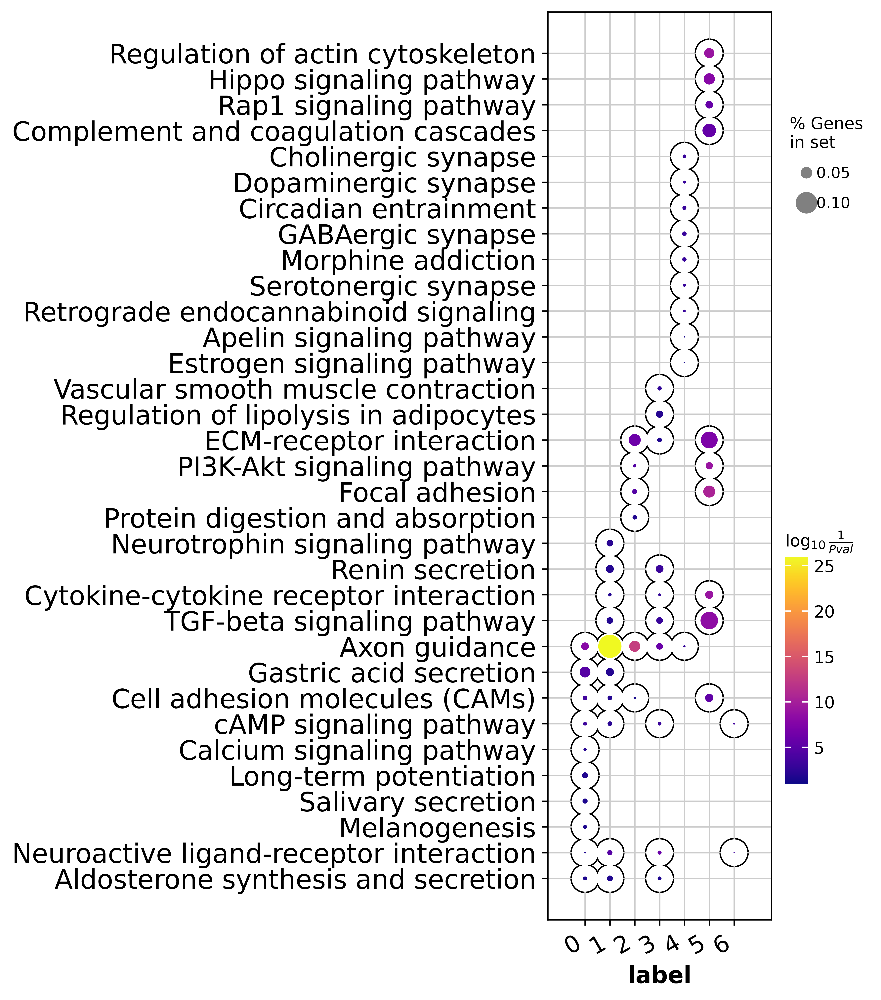

In [41]:
drop_illness=['Toxoplasmosis','diabetic', 'cancer', 'carcinoma', 'Melanoma', 'Glioma', 'Cushing syndrome', 'infection', 'Amoebiasis', 'atherosclerosis', 'cardiomyopathy', 'leukemia']
if len(drop_illness) != 0:
    merged_df_node = merged_df_node[~merged_df_node.Term.str.contains('|'.join(drop_illness))]
op.vis.enrichment(merged_df_node,x_key='label', cutoff=0.05, top_term=10,size=20, figsize=(3,10))

In [42]:
idata = idata[:, idata.var['is_svi']==1]
adata, adata_lri, adata_pattern = op.cell_transform(idata, adata, label=adata.uns['cluster_key'])
adata_lri.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']
adata_pattern.obsm['spatial'] = adata[adata_lri.obs_names].obsm['spatial']

Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_pattern, interaction_score in adata.obsm
Added key rank_interaction_score_groups, rank_interaction_pattern_groups in adata.uns


         Falling back to preprocessing with `sc.pp.pca` and default params.


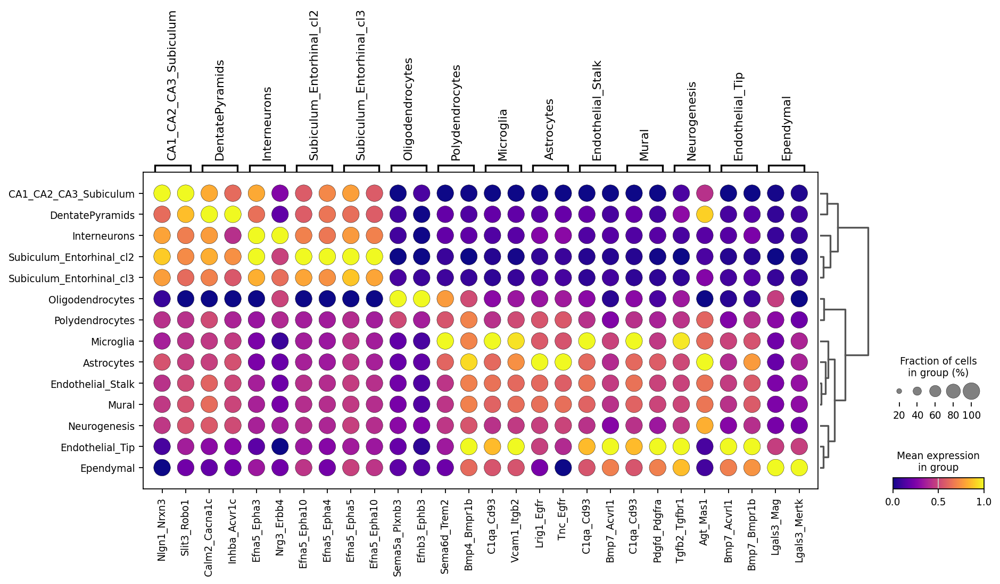

In [43]:
with plt.rc_context():
    sc.set_figure_params(figsize=(3, 3), fontsize=10)
    sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', show=False, cmap='plasma', n_genes=2)